In [1]:
wdir = '/Users/xiangxingyu/Downloads/UCB线上科研/data/'

import mne
import matplotlib
matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt
import tempfile
import matplotlib.image as mpimg
import numpy as np
import pandas as pd

%pylab inline
from numpy import *
from numpy.random import rand, randn, randint
from dPCA import dPCA

import sys
sys.path.append('./src')
from preprocessing import * 

from mpl_toolkits.axes_grid1 import make_axes_locatable

/Users/xiangxingyu/opt/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## Load & Align Data

In [2]:
_id_ = '0011_U7X'
_type_ = 'inv'

_id_number = _id_[:4]
mid = 'invert' if _type_ == 'inv' else 'recognize'

raw_fname = wdir + '01_raw_maxfiltered/' + _id_ + '/' + _type_ + '_raw_tsss.fif'
ica_fname = wdir + '02_ica_solution/' + _id_ + '/' + _type_ + '_raw_tsss-ica.fif'
lfname = wdir + 'working_memory_logs/' + _id_number + '_' + mid + '_MEG.csv'
eepochs = WM_epoching(raw_fname,ica_fname,-1, 4, 
                      baseline = (-1,0),notch_filter=50, h_freq=20,
                      events_fun = main_task_decoding_events_fun, 
                      events_fun_kwargs = {'lfname': lfname},
                      resample = 100)

Opening raw data file /Users/xiangxingyu/Downloads/UCB线上科研/data/01_raw_maxfiltered/0011_U7X/inv_raw_tsss.fif...
    Range : 6000 ... 505999 =      6.000 ...   505.999 secs
Ready.
Reading 0 ... 499999  =      0.000 ...   499.999 secs...
Reading /Users/xiangxingyu/Downloads/UCB线上科研/data/02_ica_solution/0011_U7X/inv_raw_tsss-ica.fif ...
Now restoring ICA solution ...
Ready.
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 306 PCA components
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 306 out of 306 | elapsed:    5.7s finished


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 306 out of 306 | elapsed:    8.7s finished


361 events found
Event IDs: [ 11  13  16  22  31  33 111 113 122 131 133 211 213 221 222 223 231 232
 233]
361 events found
Event IDs: [ 11  13  16  22  31  33 111 113 122 131 133 211 213 221 222 223 231 232
 233]
361 events found
Event IDs: [ 11  13  16  22  31  33 111 113 122 131 133 211 213 221 222 223 231 232
 233]
rejecting incorrect trials
Not setting metadata
59 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 59 events and 501 original time points ...
0 bad epochs dropped


In [3]:
# get data
data = eepochs.get_data()  # Shape: [E, C, T]
event_types = list(eepochs.event_id.keys())
n_event_types = len(event_types)
S = n_event_types
n_samples = max(len(eepochs[event]) for event in eepochs.event_id.keys())

N, T = data.shape[1], data.shape[2]  # N: channels, T: times

# Initialize trialR
trialR = np.zeros((n_samples, N, n_event_types, T))  # Shape: [n_samples, N, S, T]

# Fill trialR 
for i, event in enumerate(event_types):
    event_data = eepochs[event].get_data()  # Shape: [E, C, T] for this event
    
    # padding
    if event_data.shape[0] < n_samples:
        # padding with Nan
        shortfall = n_samples - event_data.shape[0]
        filler = np.full((shortfall, N, T), np.nan)
        event_data = np.concatenate([event_data, filler], axis=0)
    
    trialR[:, :, i, :] = event_data

trialR = trialR[:,:,:,:] #100:300]
print(trialR.shape)

(30, 306, 2, 501)


In [4]:
# trial-average data
R = np.nanmean(trialR,0) #skip the Nans

# center data
R -= mean(R.reshape((N,-1)),1)[:,None,None]

## Stimuli dPCA

In [5]:
dpca = dPCA.dPCA(labels='st',regularizer='auto')
dpca.protect = ['t']

You chose to determine the regularization parameter automatically. This can
                    take substantial time and grows linearly with the number of crossvalidation
                    folds. The latter can be set by changing self.n_trials (default = 3). Similarly,
                    use self.protect to set the list of axes that are not supposed to get to get shuffled
                    (e.g. upon splitting the data into test- and training, time-points should always
                    be drawn from the same trial, i.e. self.protect = ['t']). This can significantly
                    speed up the code.


In [6]:
Z = dpca.fit_transform(R,trialR)

Start optimizing regularization.
Starting trial  1 / 3
Starting trial  2 / 3
Starting trial  3 / 3
Optimized regularization, optimal lambda =  0.0006299831412818761
Regularization will be fixed; to compute the optimal                    parameter again on the next fit, please                    set opt_regularizer_flag to True.


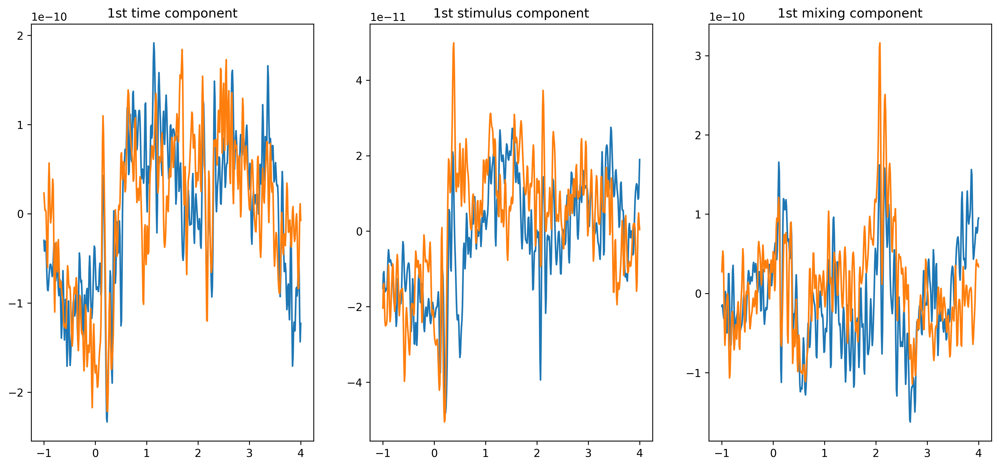

In [7]:
x = Z['st'].shape[0]
time = eepochs.times #arange(Z['st'].shape[2])

x = 1

plt.figure(figsize=(16, 7 * x), dpi=300)

for i in range(x):
    # time component subplot
    plt.subplot(x, 3, 3 * i + 1)
    for s in range(S):
        plt.plot(time, Z['t'][i, s])
    plt.title(f'{i+1}st time component')

    # stimuli component subplot
    plt.subplot(x, 3, 3 * i + 2)
    for s in range(S):
        plt.plot(time, Z['s'][i, s])
    plt.title(f'{i+1}st stimulus component')

    # st component subplot
    plt.subplot(x, 3, 3 * i + 3)
    for s in range(S):
        plt.plot(time, Z['st'][i, s])
    plt.title(f'{i+1}st mixing component')
show()

# Basis Components

In [25]:
for cz in Z:
    components = np.abs(dpca.P[cz])
    print(components.shape)
    break

(306, 10)


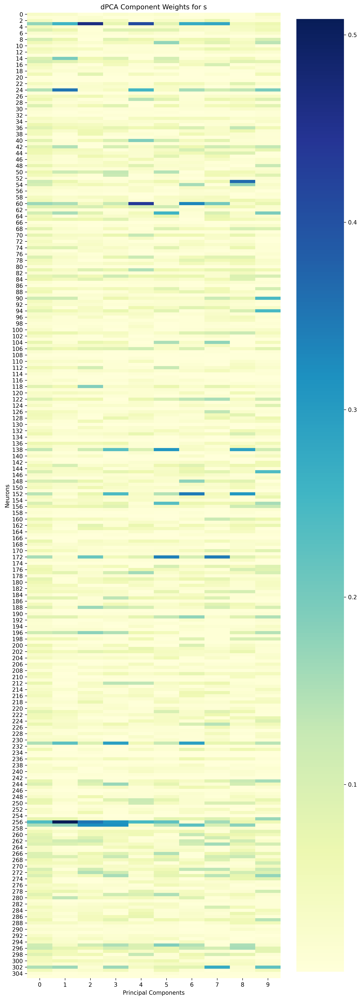

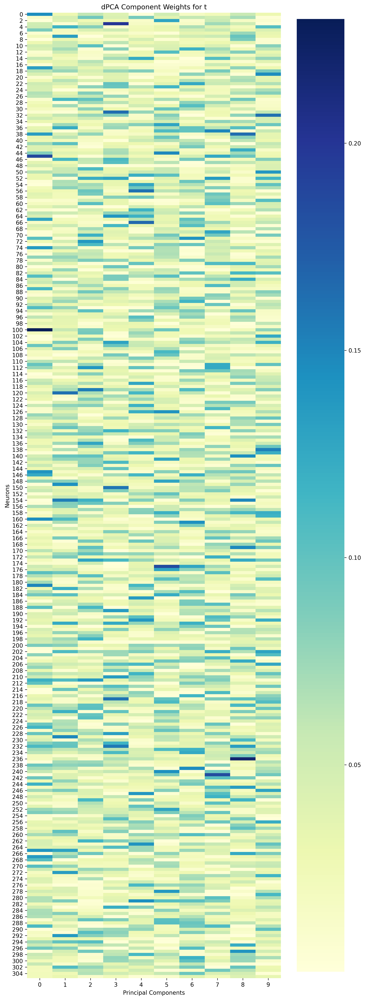

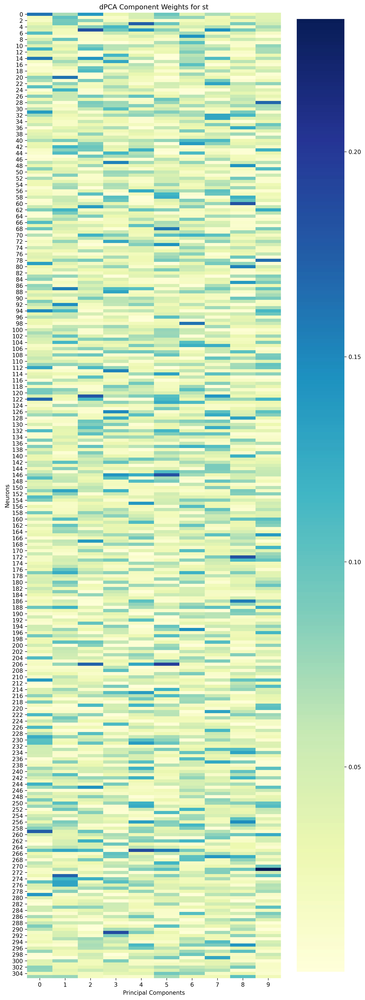

In [26]:
import seaborn as sns

for cz in Z:
    components = np.abs(dpca.P[cz])
    
    # 获取components的行数和列数
    num_rows, num_columns = components.shape

    # 调整每一行的高度
    height_per_row = 0.1  # 你可以根据需要调整这个值

    plt.figure(figsize=(10, num_rows * height_per_row))

    sns.heatmap(components, cmap="YlGnBu", cbar=True)  # 使用蓝绿色调的颜色映射
    plt.xlabel('Principal Components')
    plt.ylabel('Neurons')
    plt.title(f'dPCA Component Weights for {cz}')  # 在标题中插入component的名字
    plt.show()



<ipython-input-27-36cf76b69bf0>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


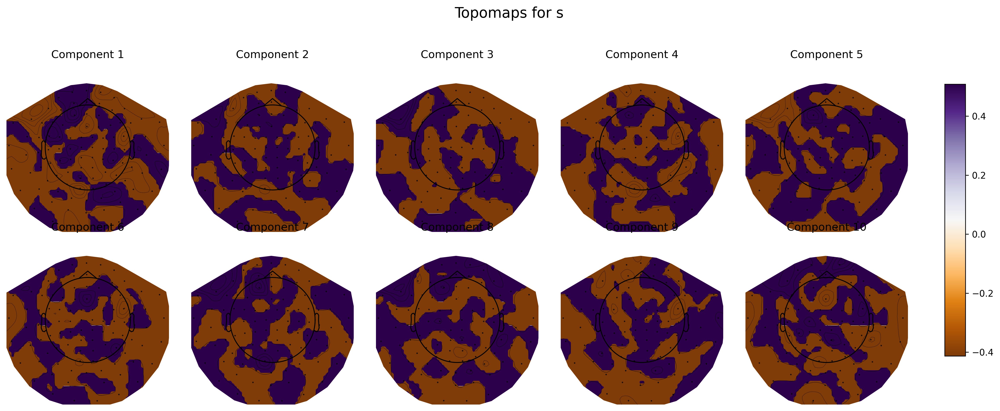

<ipython-input-27-36cf76b69bf0>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


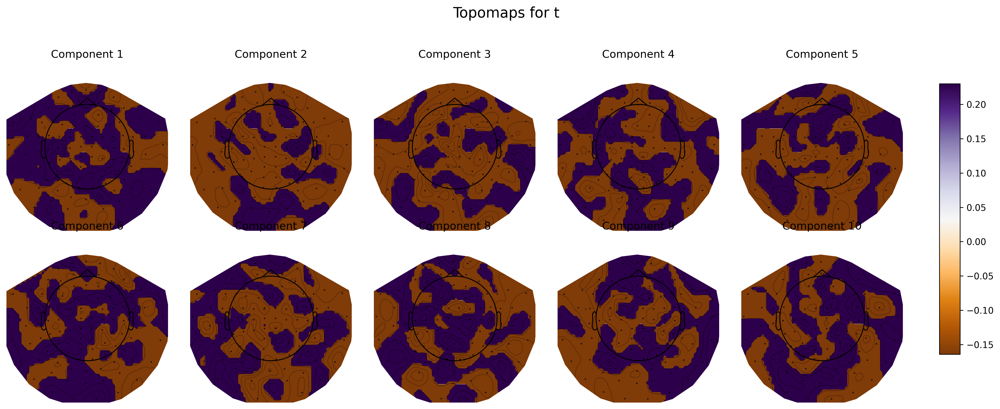

<ipython-input-27-36cf76b69bf0>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


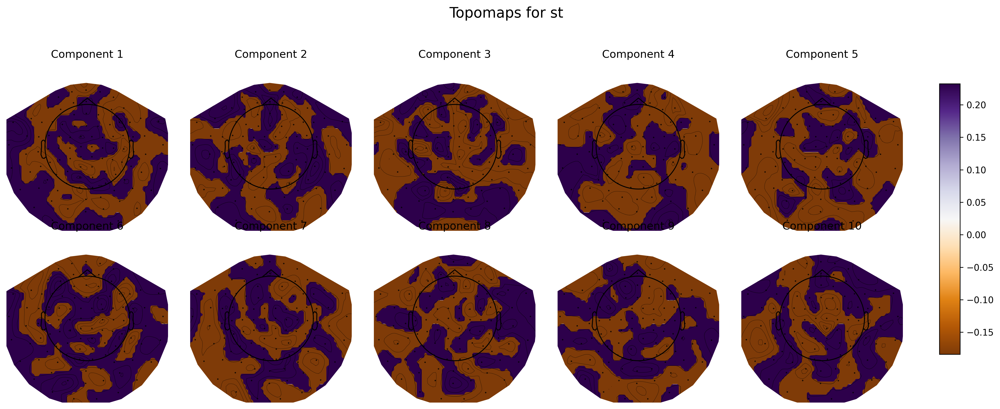

In [27]:
# Don't take absolute value

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

info = eepochs.info
picked_channels = mne.pick_types(info, meg=True, eeg=False, stim=False, eog=False,
                                 exclude='bads')
info_picked = mne.pick_info(info, picked_channels)

for cz in Z:
    components = dpca.P[cz]
    
    fig, main_axes = plt.subplots(2, 5, figsize=(16, 6))
    
    vmin = components.min()
    vmax = components.max()
    
    for idx, ax in enumerate(main_axes.ravel()):
        component = components[:, idx]
        evoked_array = mne.EvokedArray(component[:, np.newaxis], info_picked, tmin=0)
        
        # 设置色标的范围从0到components的最大值
        evoked_array.plot_topomap(times=[0], axes=ax, colorbar=False, show=False, cmap="PuOr", 
                                  outlines='head', sensors=True)
        ax.images[0].set_clim(vmin, vmax)
        ax.set_title(f'Component {idx + 1}')

    # 为色标创建一个新的轴
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(ax.images[0], cax=cbar_ax)

    fig.suptitle(f'Topomaps for {cz}', fontsize=16, y=1.05)
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()


In [ ]:
# Take absolute value

info = eepochs.info
picked_channels = mne.pick_types(info, meg=True, eeg=False, stim=False, eog=False,
                                 exclude='bads')
info_picked = mne.pick_info(info, picked_channels)

for cz in Z:
    components = np.abs(dpca.P[cz])
    
    fig, main_axes = plt.subplots(2, 5, figsize=(16, 6))
    
    vmax = components.max()
    
    for idx, ax in enumerate(main_axes.ravel()):
        component = components[:, idx]
        evoked_array = mne.EvokedArray(component[:, np.newaxis], info_picked, tmin=0)
        
        # 设置色标的范围从0到components的最大值
        evoked_array.plot_topomap(times=[0], axes=ax, colorbar=False, show=False, cmap="OrRd", 
                                  outlines='head', sensors=True)
        ax.images[0].set_clim(0, vmax)
        ax.set_title(f'Component {idx + 1}')

    # 为色标创建一个新的轴
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(ax.images[0], cax=cbar_ax)

    fig.suptitle(f'Topomaps for {cz}', fontsize=16, y=1.05)
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()

# Significance Analysis plot

In [17]:
masks,scores,null_scores = dpca.significance_analysis(R, trialR, n_shuffles=100, n_splits=100, n_consecutive=10, full = True,axis=True)
#scores2 = {cc: scores[cc].mean() for cc in scores}
null_scores = {cc: np.array(null_scores[cc]) for cc in null_scores}
ppvals = {cc: np.sum(null_scores[cc] >= scores[cc][None,:,:],axis=0)/null_scores[cc].shape[0] for cc in scores}
npvals = {cc: np.sum(null_scores[cc] <= scores[cc][None,:,:],axis=0)/null_scores[cc].shape[0] for cc in scores}
#pqvals = {cc: np.array([mne.stats.fdr_correction(ppvals[cc][cix])[1] for cix in range(ncomps)]) for cc in ppvals} 
#nqvals = {cc: np.array([mne.stats.fdr_correction(npvals[cc][cix])[1] for cix in range(ncomps)]) for cc in npvals} 
pqvals = {cc: mne.stats.fdr_correction(ppvals[cc])[1] for cc in ppvals} 
nqvals = {cc: mne.stats.fdr_correction(npvals[cc])[1] for cc in npvals} 

pmasks = {cc: pqvals[cc] <= .01 for cc in pqvals}
nmasks = {cc: nqvals[cc] <= .01 for cc in nqvals}

pmasks_clus = pmasks.copy()
nmasks_clus = nmasks.copy()
ncons = 10
cfilter = np.ones([ncons])
for cc in pmasks:
    for c in range(pmasks[cc].shape[0]):
        pconv = np.convolve(cfilter,pmasks[cc][c],mode='same')
        nconv = np.convolve(cfilter,nmasks[cc][c],mode='same')
        pix = np.where(pconv >= ncons)[0]
        nix = np.where(nconv >= ncons)[0]
        pmasks_clus[cc][c] = False
        nmasks_clus[cc][c] = False
        for px in pix:
            pmasks_clus[cc][c,px:(px+ncons)] = True
        for nx in nix:
            nmasks_clus[cc][c,nx:(nx+ncons)] = True  

Compute score of data:  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . Finished.
Compute score of shuffled data:  99 / 100 .  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .

In [18]:
scores.pop('s')

array([[0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.39, 0.39, 0.39, ..., 0.39, 0.39, 0.39],
       [0.32, 0.32, 0.32, ..., 0.32, 0.32, 0.32],
       ...,
       [0.42, 0.42, 0.42, ..., 0.42, 0.42, 0.42],
       [0.37, 0.37, 0.37, ..., 0.37, 0.37, 0.37],
       [0.36, 0.36, 0.36, ..., 0.36, 0.36, 0.36]])

plotting stats


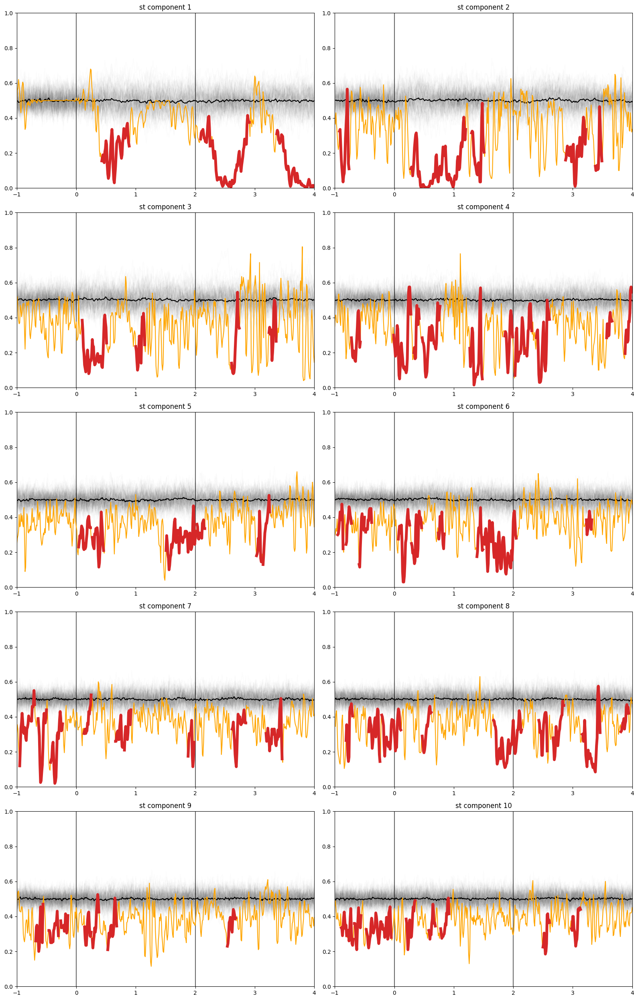

In [19]:
print('plotting stats')
ncomps = 10
times = eepochs.times
for s in scores:
    ncols = 2
    nrows = int(np.ceil(ncomps/ncols))
    fig, axes = plt.subplots(ncols=ncols,nrows=nrows, figsize = (ncols*8,nrows*5))
    for c in range(ncomps):
        cax = axes[c//ncols,c%ncols]
        cpmask = np.array(pmasks_clus[s][c].copy().astype(float))
        cnmask = np.array(nmasks_clus[s][c].copy().astype(float))
        cpmask[np.where(cpmask==0)] = np.nan
        cnmask[np.where(cnmask==0)] = np.nan
        cax.plot(times,null_scores[s][:,c,:].mean(0),color='black')
        cax.axvline(0,color='black',alpha=.6)
        cax.axvline(2,color='black',alpha=.6)
        cax.plot(times,null_scores[s][:,c,:].T,color='black',alpha=0.01)
        cax.plot(times,scores[s][c],color='orange')
        cax.plot(times,scores[s][c]*cpmask,color='tab:red',linewidth=5)
        cax.plot(times,scores[s][c]*cnmask,color='tab:red',linewidth=5)
        cax.set_title(s + ' component ' + str(c+1))
        cax.set_xlim(times[0],times[-1])
        cax.set_ylim(0,1)
    plt.tight_layout()

## Reconstruct

In [20]:
component_dimension = 'st'

reconstructed_data_s = dpca.inverse_transform(Z[component_dimension], component_dimension)

reconstructed_data_s.shape

(306, 2, 501)

In [21]:
info = eepochs.info
event_id = eepochs.event_id

n_epochs = reconstructed_data_s.shape[1]
events = np.array([
    [i*5, 0, event_id] for i, event_id in enumerate([0, 1])
])

reorganized_data = np.concatenate([reconstructed_data_s[:, [i], :] for i in range(n_epochs)], axis=1)

re_epochs = mne.EpochsArray(reorganized_data.transpose(1, 0, 2), info, events, event_id = event_id)

Not setting metadata
2 matching events found
No baseline correction applied
0 projection items activated


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


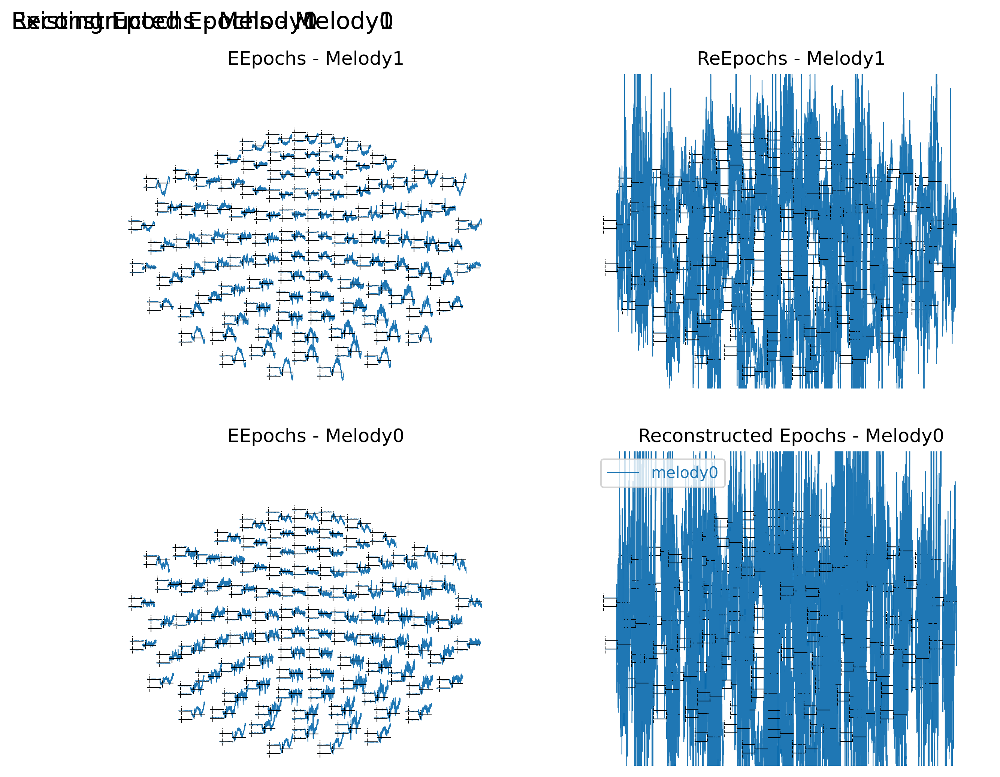

In [22]:
plt.rcParams['figure.dpi'] = 300

fig, axes = plt.subplots(2, 2, figsize=(10, 8))

ax = axes[0, 0]
eepochs['melody1'].average().plot_topo(axes=ax, title='Existing Epochs - Melody1', show=False)
ax.set_title('EEpochs - Melody1')  

ax = axes[0, 1]
re_epochs['melody1'].average().plot_topo(axes=ax, title='Reconstructed Epochs - Melody1', show=False)
ax.set_title('ReEpochs - Melody1')  

ax = axes[1, 0]
eepochs['melody0'].average().plot_topo(axes=ax, title='Existing Epochs - Melody0', show=False)
ax.set_title('EEpochs - Melody0') 

ax = axes[1, 1]
re_epochs['melody0'].average().plot_topo(axes=ax, title='Reconstructed Epochs - Melody0', show=False)
ax.set_title('Reconstructed Epochs - Melody0') 

plt.show()


# Source Estimation

In [ ]:
subjects_dir = str(mne.datasets.sample.data_path()) + '/subjects'
# subject = 'fsaverage'
subject = 'sample'
# mne.datasets.fetch_fsaverage(subjects_dir=subjects_dir)

# conductivity = (0.3, 0.006, 0.3) 
conductivity = (0.33, 0.0042, 0.33)
model = mne.make_bem_model(subject=subject, conductivity=conductivity, subjects_dir=subjects_dir)
bem = mne.make_bem_solution(model)

src = mne.setup_source_space(subject = subject, spacing = 'oct6', add_dist = False,
                             subjects_dir = str(mne.datasets.sample.data_path()) + '/subjects')

In [ ]:
fwd = mne.make_forward_solution(re_epochs.info, trans=None, src=src, bem=bem, meg=True, eeg=False, mindist=5.0)

In [ ]:
cov = mne.compute_covariance(re_epochs['melody0'], tmin=0, tmax=1)

inv = mne.minimum_norm.make_inverse_operator(re_epochs['melody0'].info, fwd, cov, loose=0.2, depth=0.8)


method = "MNE"  # 可以是 MNE, dSPM, sLORETA 等
snr = 3.0
lambda2 = 1.0 / snr ** 2
stc = mne.minimum_norm.apply_inverse(re_epochs['melody0'].average(), inv, lambda2, method)

print(f"Shape of stc.data: {stc.data.shape}")
print(f"Time points: {stc.times}")
print(f"Vertices in left hemisphere: {stc.vertices[0]}")
print(f"Vertices in right hemisphere: {stc.vertices[1]}")

In [ ]:
brain = stc.plot(subject='sample', surface='inflated', hemi='both', subjects_dir=subjects_dir)

In [ ]:
import matplotlib
matplotlib.use('Qt5Agg')
import matplotlib.pyplot as plt


initial_time = 0.1
brain = stc.plot(
    subjects_dir=subjects_dir,
    initial_time=initial_time,
    clim=dict(kind="value", lims=[3, 6, 9]),
    smoothing_steps=7,
)

In [ ]:
initial_time = 0.1
brain = stc.plot(
    subjects_dir=subjects_dir,
    initial_time=initial_time,
    clim=dict(kind="value", lims=[3, 6, 9]),
    smoothing_steps=7,
)